# Analisis de indicadores de desarrollo del Banco Mundial

### El presente es un _ejercicio_ para **analisar** informacion descargada el [Banco Mundial](https://datos.bancomundial.org/)

In [79]:
import numpy as np
import pandas as pd
import os 

Indicadores = pd.read_csv('/Users/the.greenpanter/Documents/Soyhenry/CambioCliamticoImpactoAgricola/proyecto R/Agriculture & Rural Development/API_1_DS2_en_csv_v2_6011403.csv')

Indicadores.head(30)


,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aruba,ABW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.046919,0.055358,0.092621,0.085188,0.079480,0.076267,0.104098,0.069199,0.102736,NaN
1,Aruba,ABW,Agricultural raw materials imports (% of merch...,TM.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.303687,0.398228,0.496427,0.335550,0.297792,0.311423,0.350670,0.339582,0.353604,NaN
2,Aruba,ABW,Rural population (% of total population),SP.RUR.TOTL.ZS,49.224,49.239000,49.254000,49.2700,49.285000,49.300000,...,57.010000,56.959000,56.892000,56.808000,56.707000,56.589000,56.454000,56.303000,56.134000,55.948000
3,Aruba,ABW,Rural population growth (annual %),SP.RUR.TOTL.ZG,NaN,2.211234,1.577679,1.4226,1.245827,1.065002,...,0.691192,0.601746,0.520623,0.442423,0.358555,0.287256,0.213237,-0.133220,-0.347205,-0.417236
4,Aruba,ABW,Rural population,SP.RUR.TOTL,26880.000,27481.000000,27918.000000,28318.0000,28673.000000,28980.000000,...,58652.000000,59006.000000,59314.000000,59577.000000,59791.000000,59963.000000,60091.000000,60011.000000,59803.000000,59554.000000
5,Aruba,ABW,Employment in agriculture (% of total employme...,SL.AGR.EMPL.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Aruba,ABW,"Employment in agriculture, male (% of male emp...",SL.AGR.EMPL.MA.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Aruba,ABW,"Employment in agriculture, female (% of female...",SL.AGR.EMPL.FE.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Aruba,ABW,"Agriculture, forestry, and fishing, value adde...",NV.AGR.TOTL.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,0.017817,0.014812,0.012519,0.018611,0.023921,0.022253,0.027573,NaN,NaN,NaN
9,Aruba,ABW,"Agriculture, forestry, and fishing, value adde...",NV.AGR.TOTL.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,486033.519600,413407.821200,370949.720700,555307.262600,739664.804500,729050.279300,936312.849200,NaN,NaN,NaN


In [80]:
Indicadores.tail(30)

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
11142,Zimbabwe,ZWE,Agricultural nitrous oxide emissions (% of total),EN.ATM.NOXE.AG.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11143,Zimbabwe,ZWE,Agricultural nitrous oxide emissions (thousand...,EN.ATM.NOXE.AG.KT.CE,NaN,NaN,NaN,NaN,NaN,NaN,...,4.986821e+03,4.323563e+03,4.785880e+03,4.341413e+03,4.536216e+03,4.561963e+03,4.548106e+03,4.052353e+03,NaN,NaN
11144,Zimbabwe,ZWE,Agricultural methane emissions (% of total),EN.ATM.METH.AG.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11145,Zimbabwe,ZWE,Agricultural methane emissions (thousand metri...,EN.ATM.METH.AG.KT.CE,NaN,NaN,NaN,NaN,NaN,NaN,...,7.001040e+03,5.898355e+03,6.647917e+03,6.144390e+03,6.228523e+03,6.380312e+03,6.441517e+03,5.947110e+03,NaN,NaN
11146,Zimbabwe,ZWE,"Access to electricity, rural (% of rural popul...",EG.ELC.ACCS.RU.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,1.891301e+01,7.691810e+00,1.094932e+01,2.194609e+01,2.424417e+01,2.637914e+01,2.828496e+01,3.706025e+01,3.163546e+01,NaN
11147,Zimbabwe,ZWE,Cereal yield (kg per hectare),AG.YLD.CREL.KG,NaN,9.197000e+02,9.059000e+02,8.225000e+02,8.205000e+02,9.308000e+02,...,6.685000e+02,8.314000e+02,5.575000e+02,4.351000e+02,1.203300e+03,1.254300e+03,7.480000e+02,1.148600e+03,1.545200e+03,NaN
11148,Zimbabwe,ZWE,Surface area (sq. km),AG.SRF.TOTL.K2,NaN,3.907600e+05,3.907600e+05,3.907600e+05,3.907600e+05,3.907600e+05,...,3.907600e+05,3.907600e+05,3.907600e+05,3.907600e+05,3.907600e+05,3.907600e+05,3.907600e+05,3.907600e+05,3.907600e+05,NaN
11149,Zimbabwe,ZWE,Livestock production index (2014-2016 = 100),AG.PRD.LVSK.XD,NaN,1.254000e+01,1.261000e+01,1.277000e+01,1.250000e+01,1.286000e+01,...,1.130200e+02,9.385000e+01,1.023000e+02,1.038500e+02,1.019800e+02,1.036100e+02,1.066700e+02,1.056100e+02,1.301600e+02,NaN
11150,Zimbabwe,ZWE,Food production index (2014-2016 = 100),AG.PRD.FOOD.XD,NaN,2.082000e+01,2.259000e+01,2.149000e+01,2.139000e+01,2.173000e+01,...,1.122100e+02,9.689000e+01,1.011900e+02,1.019200e+02,1.065500e+02,1.088600e+02,1.055500e+02,1.096000e+02,1.320400e+02,NaN
11151,Zimbabwe,ZWE,Crop production index (2014-2016 = 100),AG.PRD.CROP.XD,NaN,4.944000e+01,5.424000e+01,4.812000e+01,5.999000e+01,5.501000e+01,...,1.102700e+02,1.095100e+02,9.635000e+01,9.414000e+01,1.070700e+02,1.358700e+02,1.038500e+02,1.251900e+02,1.285800e+02,NaN


## Entendiendo los datos

Luego de revisar los **30 primeros** y **30 ultimos registros**; Sabemos que hay varios _indicadores_ por pais en la _misma columna_ y podemos volverlos sub tablas. Donde **de cada pais** sacaremos cada _indicador_ en un nuevo **data frame**. Pero antes vamos a entender mejor **la estructura de la tabla** con el uso de `_shape_ y de _columns_`

In [81]:
print(Indicadores.shape)

(11172, 67)


* Observamos que hay 11.172 (oncemilciento setenta y dos) registros.

In [82]:
print(Indicadores.columns)


Index(['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code',
       '1960', '1961', '1962', '1963', '1964', '1965', '1966', '1967', '1968',
       '1969', '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977',
       '1978', '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986',
       '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995',
       '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004',
       '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013',
       '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022'],
      dtype='object')


* Tambien notamos que las columnas tienen la informacion del pais y su codigo de pais (_este segundo lo podemos usar para graficar_) luego podemosnotar que esta los **indicadores** y por ultimo los **años** entonces podemos ver el **cambio** en el tiempo de los paises y comparar dicho cambio entre paises.

In [83]:
# Indicadores.info()
Indicadores.index

RangeIndex(start=0, stop=11172, step=1)

## Primeros aproximamientos a los datos y Conclusion de su estructura inicial

### Datos faltantes 

Podemos observar que los registros para ningun pais estan completos asi como hay años donde, hay mas registros que en otros.

Queremos ahora saber que paiese estan listados. 
> "
> Segun la base de datos serian todos
> "

In [84]:
paises = Indicadores['Country Name'].unique()
paises

array(['Aruba', 'Africa Eastern and Southern', 'Afghanistan',
       'Africa Western and Central', 'Angola', 'Albania', 'Andorra',
       'Arab World', 'United Arab Emirates', 'Argentina', 'Armenia',
       'American Samoa', 'Antigua and Barbuda', 'Australia', 'Austria',
       'Azerbaijan', 'Burundi', 'Belgium', 'Benin', 'Burkina Faso',
       'Bangladesh', 'Bulgaria', 'Bahrain', 'Bahamas, The',
       'Bosnia and Herzegovina', 'Belarus', 'Belize', 'Bermuda',
       'Bolivia', 'Brazil', 'Barbados', 'Brunei Darussalam', 'Bhutan',
       'Botswana', 'Central African Republic', 'Canada',
       'Central Europe and the Baltics', 'Switzerland', 'Channel Islands',
       'Chile', 'China', "Cote d'Ivoire", 'Cameroon', 'Congo, Dem. Rep.',
       'Congo, Rep.', 'Colombia', 'Comoros', 'Cabo Verde', 'Costa Rica',
       'Caribbean small states', 'Cuba', 'Curacao', 'Cayman Islands',
       'Cyprus', 'Czechia', 'Germany', 'Djibouti', 'Dominica', 'Denmark',
       'Dominican Republic', 'Algeria',
 

- Encontramos qu ehay mas que solo paieses, tambien hay agrupaciones por **Regiones Geograficas**

In [85]:
lista_paises = []
lista_regiones = []
def separar_paises_regiones(paises):
  """
  This function separates countries from regions in a list or NumPy array of country names.

  Args:
      paises (list or np.ndarray): A list of strings or a NumPy array containing country names and region names.

  Returns:
      tuple: A tuple containing two lists:
          - lista_paises: A list of countries identified by keywords like "Rep.", 
                          "Dem. Rep." or not containing indicators of regions.
          - lista_regiones: A list of region names.
  """

  

  # Check if 'paises' is a NumPy array and convert it to a list if necessary
  if isinstance(paises, np.ndarray):
    paises = paises.tolist()

  for pais in paises:
    # Check for keywords indicating regions
    if ("East" in pais) or ("West" in pais) or ("Central" in pais) or ("Southern" in pais) or ("Northern" in pais) or ("Latin America" in pais) or ("Europe" in pais) or ("Sub-Saharan Africa" in pais) or ("Arab World" in pais) or ("Middle East" in pais) or ("Asia" in pais) or ("Pacific" in pais) or ("Caribbean" in pais) or ("Baltics" in pais) or ("IDA" in pais) or ("IBRD" in pais) or ("high income" in pais) or ("low income" in pais) or ("middle income" in pais) or ("least developed" in pais) or ("developing" in pais) or ("developed" in pais) or ("small states" in pais) or ("UN classification" in pais) or ("OECD" in pais) or ("Fragile and conflict affected situations" in pais) or ("Heavily indebted poor countries (HIPC)" in pais) or ("Low income" in pais) or ("Late-demographic dividend" in pais): # or ("Pre-demographic dividend" in pais) or ("Post-demographic dividend" in pais) or ("North America" in paises) # or ("World" in paises)
      lista_regiones.append(pais)
    else:
      # Check for country indicators like "Rep." or "Dem. Rep."
      if ("Rep." in pais) or ("Dem. Rep." in pais):
        lista_paises.append(pais)
      # Otherwise, assume it's a country
      else:
        lista_paises.append(pais)
  return lista_paises, lista_regiones

lista_paises, lista_regiones = separar_paises_regiones(paises)

# print("Países:")
# lista_paises

print("\nRegiones:")
lista_regiones



Regiones:


['Africa Eastern and Southern',
 'Africa Western and Central',
 'Arab World',
 'Central African Republic',
 'Central Europe and the Baltics',
 'Caribbean small states',
 'East Asia & Pacific (excluding high income)',
 'East Asia & Pacific',
 'Europe & Central Asia (excluding high income)',
 'Europe & Central Asia',
 'European Union',
 'Fragile and conflict affected situations',
 'Heavily indebted poor countries (HIPC)',
 'IBRD only',
 'IDA & IBRD total',
 'IDA total',
 'IDA blend',
 'IDA only',
 'Latin America & Caribbean (excluding high income)',
 'Latin America & Caribbean',
 'Least developed countries: UN classification',
 'Low income',
 'Lower middle income',
 'Low & middle income',
 'Late-demographic dividend',
 'Middle East & North Africa',
 'Middle East & North Africa (excluding high income)',
 'Northern Mariana Islands',
 'OECD members',
 'Other small states',
 'West Bank and Gaza',
 'Pacific island small states',
 'South Asia',
 'Sub-Saharan Africa (excluding high income)',
 '

### Filtrando los paiese y las regiones

Al filtrar los paiese y las regiones, notamos que la tabla tiene subdivisones, donde por ejemplo esta Norte America, que incluye a Estados Unidos de America, Mexico y Canada, si separamos dicha region en otra lista, no solo se lleva la region, sino tambien los paieses en ella.

In [86]:
df_indices = Indicadores['Indicator Name'].unique()
print("El numero de Indicadores por el metodo len es: ",len(df_indices), "El numero de filas y columnas por el metodo size es: ",  df_indices.size)
df_indices

El numero de Indicadores por el metodo len es:  42 El numero de filas y columnas por el metodo size es:  42


array(['Agricultural raw materials exports (% of merchandise exports)',
       'Agricultural raw materials imports (% of merchandise imports)',
       'Rural population (% of total population)',
       'Rural population growth (annual %)', 'Rural population',
       'Employment in agriculture (% of total employment) (modeled ILO estimate)',
       'Employment in agriculture, male (% of male employment) (modeled ILO estimate)',
       'Employment in agriculture, female (% of female employment) (modeled ILO estimate)',
       'Agriculture, forestry, and fishing, value added (% of GDP)',
       'Agriculture, forestry, and fishing, value added (current US$)',
       'Annual freshwater withdrawals, agriculture (% of total freshwater withdrawal)',
       'Rural population living in areas where elevation is below 5 meters (% of total population)',
       'Agricultural nitrous oxide emissions (% of total)',
       'Agricultural nitrous oxide emissions (thousand metric tons of CO2 equivalent)',

### Indicadores

Ahora en los datos de arriba podemos observar los indicadores usados, sabemos que son **42 (cuarenta y dos) indicadores**, ahora los usaremos _como dato de referencia_ para ordernar la informacion.

In [87]:
df_ExportaciondeMaterialesAgricolasenCrudo = Indicadores[ Indicadores['Indicator Name'] == 'Agricultural raw materials exports (% of merchandise exports)']
df_ExportaciondeMaterialesAgricolasenCrudo 

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aruba,ABW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.046919,0.055358,0.092621,0.085188,0.079480,0.076267,0.104098,0.069199,0.102736,NaN
42,Africa Eastern and Southern,AFE,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.070758,1.662349,2.036478,2.166962,2.164967,2.042720,2.018790,1.988713,1.931824,1.381521
84,Afghanistan,AFG,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,53.755852,61.100605,54.437183,45.760896,...,0.036992,0.047523,14.799067,16.359109,17.063634,16.694599,21.035060,NaN,NaN,NaN
126,Africa Western and Central,AFW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,20.203394,20.523648,20.290619,18.016309,...,5.221642,3.722272,3.366732,4.586316,4.174860,4.178058,4.004207,4.102483,NaN,NaN
168,Angola,AGO,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,13.664356,NaN,NaN,NaN,...,0.001974,0.008441,0.033736,0.233868,0.262744,0.357368,0.055077,0.092253,0.002204,0.001427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10962,Kosovo,XKX,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11004,"Yemen, Rep.",YEM,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.158565,0.643776,1.549085,NaN,NaN,NaN,0.017167,NaN,NaN,NaN
11046,South Africa,ZAF,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.948755,2.049448,2.302119,2.465114,2.368871,2.322444,1.883488,2.006564,1.704013,1.934010
11088,Zambia,ZMB,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.157423,1.802165,1.460892,1.504282,0.800512,0.940920,1.330600,0.861170,0.699421,NaN


In [88]:
df_ExportaciondeMaterialesAgricolasenCrudo1 = Indicadores.query("`Indicator Name` == 'Agricultural raw materials exports (% of merchandise exports)'")
df_ExportaciondeMaterialesAgricolasenCrudo1

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aruba,ABW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.046919,0.055358,0.092621,0.085188,0.079480,0.076267,0.104098,0.069199,0.102736,NaN
42,Africa Eastern and Southern,AFE,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.070758,1.662349,2.036478,2.166962,2.164967,2.042720,2.018790,1.988713,1.931824,1.381521
84,Afghanistan,AFG,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,53.755852,61.100605,54.437183,45.760896,...,0.036992,0.047523,14.799067,16.359109,17.063634,16.694599,21.035060,NaN,NaN,NaN
126,Africa Western and Central,AFW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,20.203394,20.523648,20.290619,18.016309,...,5.221642,3.722272,3.366732,4.586316,4.174860,4.178058,4.004207,4.102483,NaN,NaN
168,Angola,AGO,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,13.664356,NaN,NaN,NaN,...,0.001974,0.008441,0.033736,0.233868,0.262744,0.357368,0.055077,0.092253,0.002204,0.001427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10962,Kosovo,XKX,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11004,"Yemen, Rep.",YEM,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.158565,0.643776,1.549085,NaN,NaN,NaN,0.017167,NaN,NaN,NaN
11046,South Africa,ZAF,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.948755,2.049448,2.302119,2.465114,2.368871,2.322444,1.883488,2.006564,1.704013,1.934010
11088,Zambia,ZMB,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.157423,1.802165,1.460892,1.504282,0.800512,0.940920,1.330600,0.861170,0.699421,NaN


### Revision del filtrado

Habiendo usado dos metodos para filtrar la informacion encontramos que los valoes **_NaN_** nos aparecen como false, buscando en internet encontramos que:
> " 
> If your DataFrame has missing values (represented by NaN or None), the comparison might not behave as expected depending on how missing values are handled.
> " 

In [89]:
df2 = (df_ExportaciondeMaterialesAgricolasenCrudo == df_ExportaciondeMaterialesAgricolasenCrudo1)
df2

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,True,True,True,True,False,False,False,False,False,False,...,True,True,True,True,True,True,True,True,True,False
42,True,True,True,True,False,False,False,False,False,False,...,True,True,True,True,True,True,True,True,True,True
84,True,True,True,True,False,False,True,True,True,True,...,True,True,True,True,True,True,True,False,False,False
126,True,True,True,True,False,False,True,True,True,True,...,True,True,True,True,True,True,True,True,False,False
168,True,True,True,True,False,False,True,False,False,False,...,True,True,True,True,True,True,True,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10962,True,True,True,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
11004,True,True,True,True,False,False,False,False,False,False,...,True,True,True,False,False,False,True,False,False,False
11046,True,True,True,True,False,False,False,False,False,False,...,True,True,True,True,True,True,True,True,True,True
11088,True,True,True,True,False,False,False,False,False,False,...,True,True,True,True,True,True,True,True,True,False


In [90]:
df_ExportaciondeMaterialesAgricolasenCrudo.isnull().sum()


Country Name        0
Country Code        0
Indicator Name      0
Indicator Code      0
1960              266
                 ... 
2018               61
2019               66
2020               75
2021               82
2022              136
Length: 67, dtype: int64

In [91]:
df_ExportaciondeMaterialesAgricolasenCrudo1.isnull().sum()

Country Name        0
Country Code        0
Indicator Name      0
Indicator Code      0
1960              266
                 ... 
2018               61
2019               66
2020               75
2021               82
2022              136
Length: 67, dtype: int64

In [92]:
df_ExportaciondeMaterialesAgricolasenCrudo.dropna( how='all', inplace=True)
df_ExportaciondeMaterialesAgricolasenCrudo

/var/folders/n7/x0fwwp8x0jvgxqnmqjfvghqh0000gn/T/ipykernel_12094/1398959849.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ExportaciondeMaterialesAgricolasenCrudo.dropna( how='all', inplace=True)


,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aruba,ABW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.046919,0.055358,0.092621,0.085188,0.079480,0.076267,0.104098,0.069199,0.102736,NaN
42,Africa Eastern and Southern,AFE,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.070758,1.662349,2.036478,2.166962,2.164967,2.042720,2.018790,1.988713,1.931824,1.381521
84,Afghanistan,AFG,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,53.755852,61.100605,54.437183,45.760896,...,0.036992,0.047523,14.799067,16.359109,17.063634,16.694599,21.035060,NaN,NaN,NaN
126,Africa Western and Central,AFW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,20.203394,20.523648,20.290619,18.016309,...,5.221642,3.722272,3.366732,4.586316,4.174860,4.178058,4.004207,4.102483,NaN,NaN
168,Angola,AGO,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,13.664356,NaN,NaN,NaN,...,0.001974,0.008441,0.033736,0.233868,0.262744,0.357368,0.055077,0.092253,0.002204,0.001427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10962,Kosovo,XKX,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11004,"Yemen, Rep.",YEM,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.158565,0.643776,1.549085,NaN,NaN,NaN,0.017167,NaN,NaN,NaN
11046,South Africa,ZAF,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.948755,2.049448,2.302119,2.465114,2.368871,2.322444,1.883488,2.006564,1.704013,1.934010
11088,Zambia,ZMB,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.157423,1.802165,1.460892,1.504282,0.800512,0.940920,1.330600,0.861170,0.699421,NaN


### Limpiamos los datos las filas que todas son nulas

A continuacion vamos a revisar los datos eliminados con los filtrados

In [93]:
df_ExportaciondeMaterialesAgricolasenCrudo.index


Index([    0,    42,    84,   126,   168,   210,   252,   294,   336,   378,
       ...
       10752, 10794, 10836, 10878, 10920, 10962, 11004, 11046, 11088, 11130],
      dtype='int64', length=266)

In [94]:
df_ExportaciondeMaterialesAgricolasenCrudo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 266 entries, 0 to 11130
Data columns (total 67 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    266 non-null    object 
 1   Country Code    266 non-null    object 
 2   Indicator Name  266 non-null    object 
 3   Indicator Code  266 non-null    object 
 4   1960            0 non-null      float64
 5   1961            0 non-null      float64
 6   1962            88 non-null     float64
 7   1963            94 non-null     float64
 8   1964            93 non-null     float64
 9   1965            100 non-null    float64
 10  1966            104 non-null    float64
 11  1967            104 non-null    float64
 12  1968            108 non-null    float64
 13  1969            107 non-null    float64
 14  1970            127 non-null    float64
 15  1971            130 non-null    float64
 16  1972            136 non-null    float64
 17  1973            136 non-null    float6

In [95]:
df_ExportaciondeMaterialesAgricolasenCrudoReindexado = df_ExportaciondeMaterialesAgricolasenCrudo.reset_index(drop = True)

# Eliminar filas que contienen valores nulos
# df = df.dropna()

# Reindexar el DataFrame
# df = df.reset_index(drop=True)
df_ExportaciondeMaterialesAgricolasenCrudoReindexado

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aruba,ABW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.046919,0.055358,0.092621,0.085188,0.079480,0.076267,0.104098,0.069199,0.102736,NaN
1,Africa Eastern and Southern,AFE,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.070758,1.662349,2.036478,2.166962,2.164967,2.042720,2.018790,1.988713,1.931824,1.381521
2,Afghanistan,AFG,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,53.755852,61.100605,54.437183,45.760896,...,0.036992,0.047523,14.799067,16.359109,17.063634,16.694599,21.035060,NaN,NaN,NaN
3,Africa Western and Central,AFW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,20.203394,20.523648,20.290619,18.016309,...,5.221642,3.722272,3.366732,4.586316,4.174860,4.178058,4.004207,4.102483,NaN,NaN
4,Angola,AGO,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,13.664356,NaN,NaN,NaN,...,0.001974,0.008441,0.033736,0.233868,0.262744,0.357368,0.055077,0.092253,0.002204,0.001427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
262,"Yemen, Rep.",YEM,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.158565,0.643776,1.549085,NaN,NaN,NaN,0.017167,NaN,NaN,NaN
263,South Africa,ZAF,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.948755,2.049448,2.302119,2.465114,2.368871,2.322444,1.883488,2.006564,1.704013,1.934010
264,Zambia,ZMB,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.157423,1.802165,1.460892,1.504282,0.800512,0.940920,1.330600,0.861170,0.699421,NaN


### Removiendo las colimnas que solo tienen datos NAN

Sabemos que las columnas  1960 y 1961 son solo datos nullos las podemos remover basados en la informacion obtenida anteriormente
> ````
>   Column          Non-Null Count  Dtype  
>   1960            0 non-null      float64
>   1961            0 non-null      float64
> ````


In [96]:
df_ExportaciondeMaterialesAgricolasenCrudoReindexado.drop(['1960','1961'], axis=1, inplace=True)
df_ExportaciondeMaterialesAgricolasenCrudoReindexado

,Country Name,Country Code,Indicator Name,Indicator Code,1962,1963,1964,1965,1966,1967,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aruba,ABW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.046919,0.055358,0.092621,0.085188,0.079480,0.076267,0.104098,0.069199,0.102736,NaN
1,Africa Eastern and Southern,AFE,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.070758,1.662349,2.036478,2.166962,2.164967,2.042720,2.018790,1.988713,1.931824,1.381521
2,Afghanistan,AFG,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,53.755852,61.100605,54.437183,45.760896,51.714982,46.355726,...,0.036992,0.047523,14.799067,16.359109,17.063634,16.694599,21.035060,NaN,NaN,NaN
3,Africa Western and Central,AFW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,20.203394,20.523648,20.290619,18.016309,18.584310,17.145280,...,5.221642,3.722272,3.366732,4.586316,4.174860,4.178058,4.004207,4.102483,NaN,NaN
4,Angola,AGO,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,13.664356,NaN,NaN,NaN,NaN,NaN,...,0.001974,0.008441,0.033736,0.233868,0.262744,0.357368,0.055077,0.092253,0.002204,0.001427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
262,"Yemen, Rep.",YEM,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.158565,0.643776,1.549085,NaN,NaN,NaN,0.017167,NaN,NaN,NaN
263,South Africa,ZAF,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.948755,2.049448,2.302119,2.465114,2.368871,2.322444,1.883488,2.006564,1.704013,1.934010
264,Zambia,ZMB,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,0.359047,0.243751,...,2.157423,1.802165,1.460892,1.504282,0.800512,0.940920,1.330600,0.861170,0.699421,NaN


Despues de eliminar las columnas sin datos vamos a ser una re-indexacion con los nombres de los paises, para ello usaremos el metodo `set_index()`

In [97]:
df_paragraficar = df_ExportaciondeMaterialesAgricolasenCrudoReindexado
df_paragraficar

,Country Name,Country Code,Indicator Name,Indicator Code,1962,1963,1964,1965,1966,1967,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aruba,ABW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.046919,0.055358,0.092621,0.085188,0.079480,0.076267,0.104098,0.069199,0.102736,NaN
1,Africa Eastern and Southern,AFE,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.070758,1.662349,2.036478,2.166962,2.164967,2.042720,2.018790,1.988713,1.931824,1.381521
2,Afghanistan,AFG,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,53.755852,61.100605,54.437183,45.760896,51.714982,46.355726,...,0.036992,0.047523,14.799067,16.359109,17.063634,16.694599,21.035060,NaN,NaN,NaN
3,Africa Western and Central,AFW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,20.203394,20.523648,20.290619,18.016309,18.584310,17.145280,...,5.221642,3.722272,3.366732,4.586316,4.174860,4.178058,4.004207,4.102483,NaN,NaN
4,Angola,AGO,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,13.664356,NaN,NaN,NaN,NaN,NaN,...,0.001974,0.008441,0.033736,0.233868,0.262744,0.357368,0.055077,0.092253,0.002204,0.001427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
262,"Yemen, Rep.",YEM,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.158565,0.643776,1.549085,NaN,NaN,NaN,0.017167,NaN,NaN,NaN
263,South Africa,ZAF,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.948755,2.049448,2.302119,2.465114,2.368871,2.322444,1.883488,2.006564,1.704013,1.934010
264,Zambia,ZMB,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,0.359047,0.243751,...,2.157423,1.802165,1.460892,1.504282,0.800512,0.940920,1.330600,0.861170,0.699421,NaN


In [98]:
df_ExportaciondeMaterialesAgricolasenCrudoReindexado

,Country Name,Country Code,Indicator Name,Indicator Code,1962,1963,1964,1965,1966,1967,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aruba,ABW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.046919,0.055358,0.092621,0.085188,0.079480,0.076267,0.104098,0.069199,0.102736,NaN
1,Africa Eastern and Southern,AFE,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.070758,1.662349,2.036478,2.166962,2.164967,2.042720,2.018790,1.988713,1.931824,1.381521
2,Afghanistan,AFG,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,53.755852,61.100605,54.437183,45.760896,51.714982,46.355726,...,0.036992,0.047523,14.799067,16.359109,17.063634,16.694599,21.035060,NaN,NaN,NaN
3,Africa Western and Central,AFW,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,20.203394,20.523648,20.290619,18.016309,18.584310,17.145280,...,5.221642,3.722272,3.366732,4.586316,4.174860,4.178058,4.004207,4.102483,NaN,NaN
4,Angola,AGO,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,13.664356,NaN,NaN,NaN,NaN,NaN,...,0.001974,0.008441,0.033736,0.233868,0.262744,0.357368,0.055077,0.092253,0.002204,0.001427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
262,"Yemen, Rep.",YEM,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.158565,0.643776,1.549085,NaN,NaN,NaN,0.017167,NaN,NaN,NaN
263,South Africa,ZAF,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.948755,2.049448,2.302119,2.465114,2.368871,2.322444,1.883488,2.006564,1.704013,1.934010
264,Zambia,ZMB,Agricultural raw materials exports (% of merch...,TX.VAL.AGRI.ZS.UN,NaN,NaN,NaN,NaN,0.359047,0.243751,...,2.157423,1.802165,1.460892,1.504282,0.800512,0.940920,1.330600,0.861170,0.699421,NaN


In [99]:
df_ExportaciondeMaterialesAgricolasenCrudo.describe()

,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
count,0.0,0.0,88.000000,94.000000,93.000000,100.000000,104.000000,104.000000,108.000000,107.000000,...,213.000000,209.000000,212.000000,212.000000,213.000000,205.000000,200.000000,191.000000,184.000000,130.000000
mean,NaN,NaN,14.713578,14.481208,14.224303,14.771472,14.643080,13.964583,13.504752,13.287373,...,3.184838,3.462454,2.861862,3.277129,3.208924,3.252580,2.868865,2.577371,2.579565,2.198985
std,NaN,NaN,15.201082,15.366078,15.393449,15.398453,15.329017,15.274939,15.304934,15.168285,...,6.574592,9.477091,5.265335,7.044947,6.803419,7.485717,5.958009,5.444232,6.088580,6.913698
min,NaN,NaN,0.022262,0.025381,0.021854,0.019341,0.041712,0.019146,0.021302,0.025454,...,0.000000,0.000224,0.000002,0.000484,0.000018,0.000000,0.000000,0.000032,0.002204,0.001427
25%,NaN,NaN,4.051940,4.109082,3.598575,4.178272,3.828724,3.559646,2.936047,3.127761,...,0.597705,0.531812,0.611210,0.677018,0.557417,0.515134,0.509051,0.561377,0.614889,0.493865
50%,NaN,NaN,9.144304,10.309248,9.178334,10.092859,10.157357,8.770311,7.943249,8.096671,...,1.530860,1.444097,1.488481,1.502973,1.455084,1.381410,1.330705,1.331006,1.301441,0.911271
75%,NaN,NaN,20.013693,17.858936,17.442019,19.439816,19.071849,20.817604,19.930048,15.941693,...,3.113348,2.629391,2.595508,2.840621,2.886009,2.799611,2.726697,2.658516,2.317108,1.811373
max,NaN,NaN,75.256697,79.962100,81.852079,80.093890,80.260715,86.116506,88.036462,85.013394,...,52.152172,98.947202,49.799360,68.239171,65.623290,73.289734,64.557311,64.643801,74.880805,76.839132


Obtenemos algunos valores estadisticos que pueden resultar utiles para graficar

In [100]:
serieAnios = df_ExportaciondeMaterialesAgricolasenCrudoReindexado.columns
serieAnios = serieAnios[4:]
df_columnas_numericas = df_ExportaciondeMaterialesAgricolasenCrudoReindexado[serieAnios]

In [101]:
df_columnas_numericas["Promedio"] = df_columnas_numericas.mean(axis=1, skipna=True)
df_columnas_numericas["Pais"] = df_ExportaciondeMaterialesAgricolasenCrudoReindexado["Country Name"]

/var/folders/n7/x0fwwp8x0jvgxqnmqjfvghqh0000gn/T/ipykernel_12094/466368430.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_columnas_numericas["Promedio"] = df_columnas_numericas.mean(axis=1, skipna=True)
/var/folders/n7/x0fwwp8x0jvgxqnmqjfvghqh0000gn/T/ipykernel_12094/466368430.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_columnas_numericas["Pais"] = df_ExportaciondeMaterialesAgricolasenCrudoReindexado["Country Name"]


In [102]:
df_columnas_numericas

,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,...,2015,2016,2017,2018,2019,2020,2021,2022,Promedio,Pais
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.092621,0.085188,0.079480,0.076267,0.104098,0.069199,0.102736,NaN,0.381298,Aruba
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.036478,2.166962,2.164967,2.042720,2.018790,1.988713,1.931824,1.381521,3.569641,Africa Eastern and Southern
2,53.755852,61.100605,54.437183,45.760896,51.714982,46.355726,38.092087,38.050799,35.824004,45.656350,...,14.799067,16.359109,17.063634,16.694599,21.035060,NaN,NaN,NaN,28.583130,Afghanistan
3,20.203394,20.523648,20.290619,18.016309,18.584310,17.145280,17.533438,15.167499,16.351477,13.931496,...,3.366732,4.586316,4.174860,4.178058,4.004207,4.102483,NaN,NaN,9.375414,Africa Western and Central
4,13.664356,NaN,NaN,NaN,NaN,NaN,NaN,9.381066,8.225802,9.813143,...,0.033736,0.233868,0.262744,0.357368,0.055077,0.092253,0.002204,0.001427,2.627115,Angola
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Kosovo
262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.549085,NaN,NaN,NaN,0.017167,NaN,NaN,NaN,4.271225,"Yemen, Rep."
263,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.302119,2.465114,2.368871,2.322444,1.883488,2.006564,1.704013,1.934010,3.452274,South Africa
264,NaN,NaN,NaN,NaN,0.359047,0.243751,NaN,NaN,0.143650,0.486644,...,1.460892,1.504282,0.800512,0.940920,1.330600,0.861170,0.699421,NaN,2.151258,Zambia


## Grafias

Ahora intentaremos graficar la informacion un poco para poder obtener los posibles resultados.

In [103]:
paisesG = pd.Series(lista_paises)
paisesG

0             Aruba
1       Afghanistan
2            Angola
3           Albania
4           Andorra
           ...     
219          Kosovo
220     Yemen, Rep.
221    South Africa
222          Zambia
223        Zimbabwe
Length: 224, dtype: object

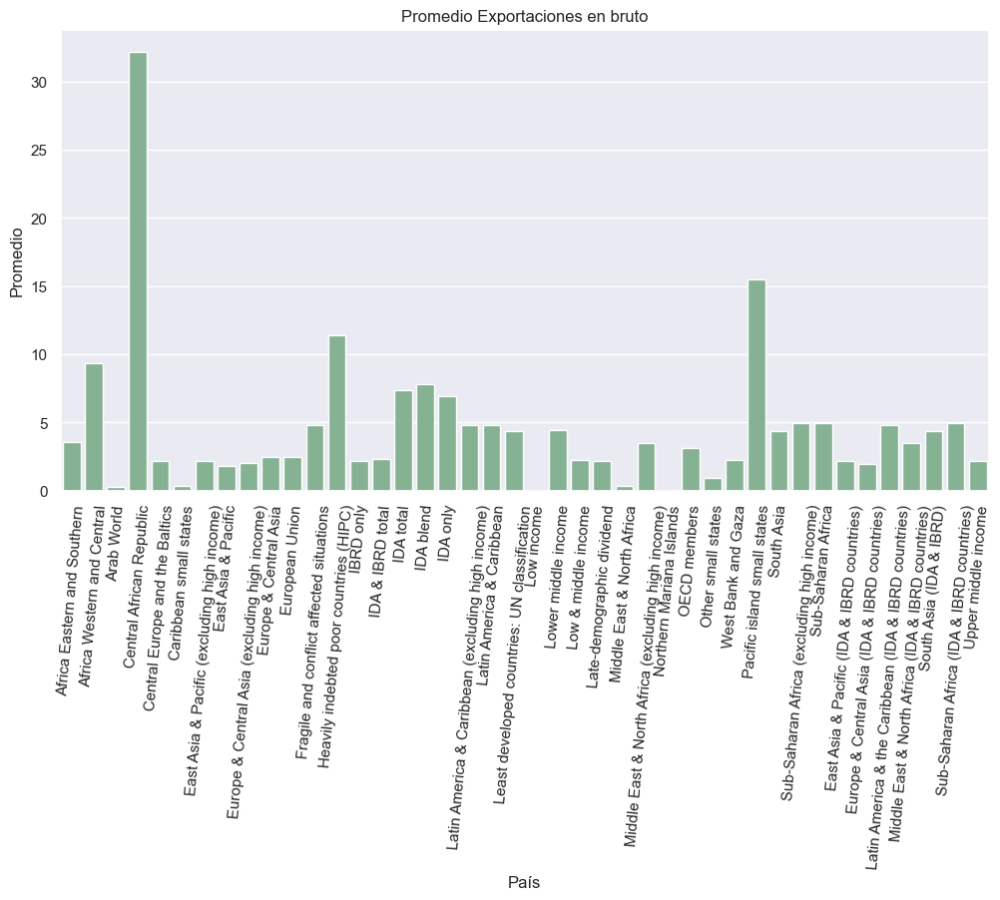

<Figure size 9e+20x2e+14 with 0 Axes>

In [104]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))
sns.set_theme(style="darkgrid",palette='crest',font="Arial",font_scale=1)
sns.barplot(x=df_columnas_numericas[df_columnas_numericas["Pais"].isin(lista_regiones)]["Pais"], y=df_columnas_numericas["Promedio"])
# sns.barplot(x=df_columnas_numericas["Pais"].iloc[9:19], y=df_columnas_numericas["Promedio"].iloc[9:19])
plt.title('Promedio Exportaciones en bruto')
plt.xticks(rotation=85)
plt.xlabel('País')
plt.ylabel("Promedio")
plt.figure(figsize=(9000000000000000000, 2000000000000)) # Tamaño en pulgadas (ancho, alto)
plt.show()

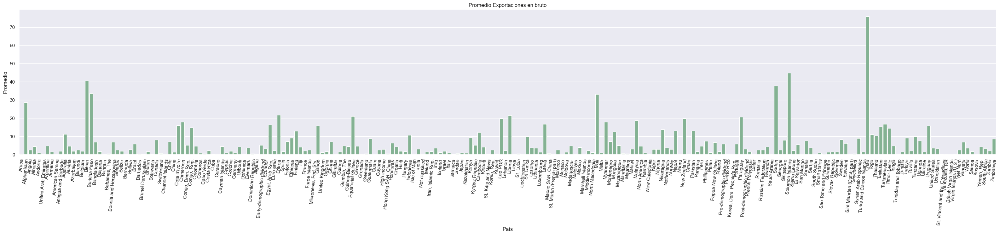

<Figure size 9e+20x2e+14 with 0 Axes>

In [105]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(40,6))
sns.set_theme(style="darkgrid",palette='crest',font="Arial",font_scale=1)
sns.barplot(x=df_columnas_numericas[df_columnas_numericas["Pais"].isin(lista_paises)]["Pais"], y=df_columnas_numericas["Promedio"])
# sns.barplot(x=df_columnas_numericas["Pais"].iloc[9:19], y=df_columnas_numericas["Promedio"].iloc[9:19])
plt.title('Promedio Exportaciones en bruto')
plt.xticks(rotation=85)
plt.xlabel('País')
plt.ylabel("Promedio")
plt.figure(figsize=(9000000000000000000, 2000000000000)) # Tamaño en pulgadas (ancho, alto)
plt.show()

Ahora tenemos graficado en promedio cuanto exportan lo paises en material crudo, pero podriamos observar dicho dato en los años, para ello vamos a usar un grafico de puntos de seaborn, este exige que las columnas sean los paies y los años sea los indices. Entonces usando `transpose()` vamos a obtener la transpuesta de los datos a graficar



In [106]:
df_paragraficar = df_paragraficar.drop(["Country Code",	"Indicator Name", "Indicator Code"], axis=1)



In [107]:
df_paragraficar

,Country Name,1962,1963,1964,1965,1966,1967,1968,1969,1970,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aruba,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.046919,0.055358,0.092621,0.085188,0.079480,0.076267,0.104098,0.069199,0.102736,NaN
1,Africa Eastern and Southern,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.070758,1.662349,2.036478,2.166962,2.164967,2.042720,2.018790,1.988713,1.931824,1.381521
2,Afghanistan,53.755852,61.100605,54.437183,45.760896,51.714982,46.355726,38.092087,38.050799,35.824004,...,0.036992,0.047523,14.799067,16.359109,17.063634,16.694599,21.035060,NaN,NaN,NaN
3,Africa Western and Central,20.203394,20.523648,20.290619,18.016309,18.584310,17.145280,17.533438,15.167499,16.351477,...,5.221642,3.722272,3.366732,4.586316,4.174860,4.178058,4.004207,4.102483,NaN,NaN
4,Angola,13.664356,NaN,NaN,NaN,NaN,NaN,NaN,9.381066,8.225802,...,0.001974,0.008441,0.033736,0.233868,0.262744,0.357368,0.055077,0.092253,0.002204,0.001427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
262,"Yemen, Rep.",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.158565,0.643776,1.549085,NaN,NaN,NaN,0.017167,NaN,NaN,NaN
263,South Africa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.948755,2.049448,2.302119,2.465114,2.368871,2.322444,1.883488,2.006564,1.704013,1.934010
264,Zambia,NaN,NaN,NaN,NaN,0.359047,0.243751,NaN,NaN,0.143650,...,2.157423,1.802165,1.460892,1.504282,0.800512,0.940920,1.330600,0.861170,0.699421,NaN


In [108]:
# Filtrar el DataFrame por los países de lista_paises
df_paises = df_paragraficar[df_paragraficar["Country Name"].isin(lista_paises)]
df_paises = df_paises.set_index("Country Name")

# Filtrar el DataFrame por las regiones de lista_regiones
df_regiones = df_paragraficar[df_paragraficar["Country Name"].isin(lista_regiones)]
df_regiones = df_regiones.set_index("Country Name")

In [109]:
df_paisesT = df_paises.transpose()
df_regionesT = df_regiones.transpose()

In [110]:
df_regionesT

Country Name,Africa Eastern and Southern,Africa Western and Central,Arab World,Central African Republic,Central Europe and the Baltics,Caribbean small states,East Asia & Pacific (excluding high income),East Asia & Pacific,Europe & Central Asia (excluding high income),Europe & Central Asia,...,South Asia,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,East Asia & Pacific (IDA & IBRD countries),Europe & Central Asia (IDA & IBRD countries),Latin America & the Caribbean (IDA & IBRD countries),Middle East & North Africa (IDA & IBRD countries),South Asia (IDA & IBRD),Sub-Saharan Africa (IDA & IBRD countries),Upper middle income
1962,NaN,20.203394,NaN,40.751887,NaN,NaN,NaN,NaN,NaN,5.561277,...,13.470184,NaN,NaN,NaN,NaN,16.955807,NaN,13.470184,NaN,NaN
1963,NaN,20.523648,NaN,31.031882,NaN,NaN,NaN,NaN,NaN,5.720726,...,12.604091,NaN,NaN,NaN,NaN,14.282479,4.106909,12.604091,NaN,NaN
1964,NaN,20.290619,NaN,23.838053,NaN,NaN,NaN,NaN,NaN,5.406524,...,12.046561,NaN,NaN,NaN,NaN,13.240043,NaN,12.046561,NaN,NaN
1965,NaN,18.016309,NaN,23.964960,NaN,NaN,NaN,NaN,NaN,5.121531,...,11.478881,NaN,NaN,NaN,NaN,13.573212,NaN,11.478881,NaN,NaN
1966,NaN,18.584310,NaN,19.958045,NaN,NaN,NaN,NaN,NaN,5.029527,...,10.668621,NaN,NaN,NaN,NaN,13.874402,10.156507,10.668621,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018,2.042720,4.178058,0.159548,29.424586,1.603384,0.528666,1.103368,1.044760,1.662225,1.319688,...,1.557988,2.831584,2.827196,1.103368,1.593419,2.564190,NaN,1.557988,2.827196,1.298492
2019,2.018790,4.004207,0.145927,12.268763,1.482264,0.512843,1.088397,0.985936,1.625843,1.284130,...,1.222779,2.731004,2.726697,1.088397,1.502550,2.525665,NaN,1.222779,2.726697,1.292028
2020,1.988713,4.102483,0.164992,18.994789,1.397868,0.557502,0.992672,0.888674,1.834704,1.331006,...,1.446434,2.675975,2.671535,0.992672,1.647982,2.422025,NaN,1.446434,2.671535,1.279316
2021,1.931824,NaN,0.168195,NaN,1.599304,0.456816,1.022463,0.928603,1.724631,1.423347,...,1.549841,2.613340,2.610531,1.022463,1.580005,2.094239,NaN,1.549841,2.610531,1.215110


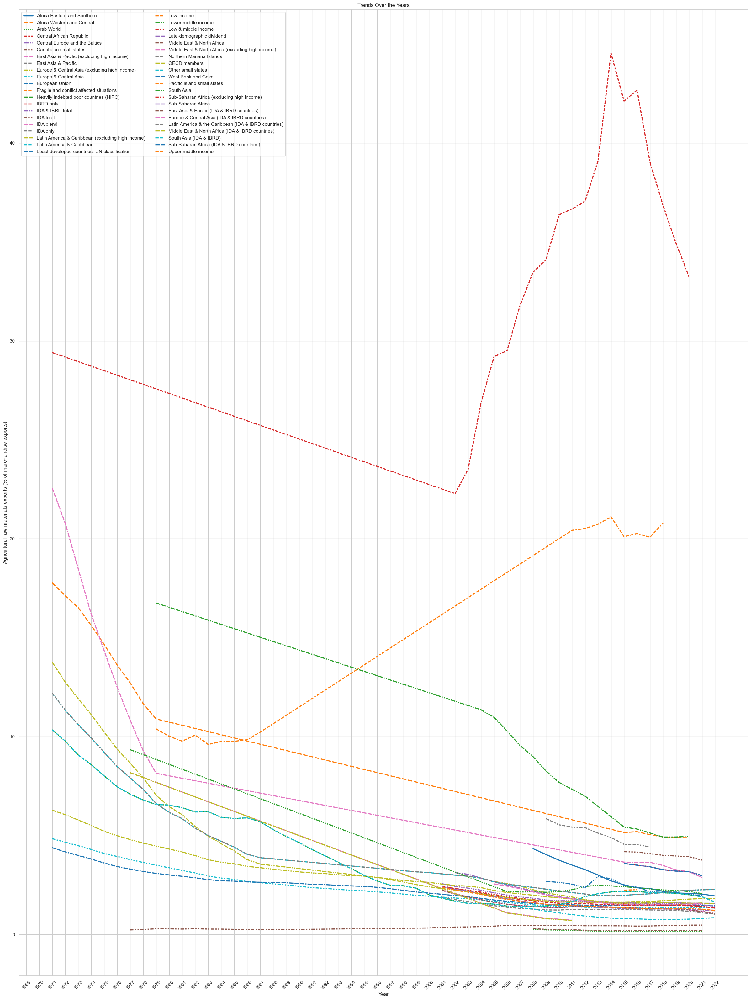

In [111]:


# Smooth the data using rolling mean
df_smoothed = df_regionesT.rolling(window=10).mean()

# Plot the data using Seaborn line plot
sns.set_theme(style="whitegrid")
plt.figure(figsize=(30, 40))
sns.lineplot(data=df_smoothed, palette="tab10", linewidth=2.5)
# Ajusta la leyenda aparte
plt.legend(loc='best', ncol=2)
# Optional: Adjust the figure size, title, labels, etc.
plt.title('Trends Over the Years')
plt.xlabel('Year')
plt.ylabel('Agricultural raw materials exports (% of merchandise exports)')
plt.xticks(rotation=45)


plt.show()

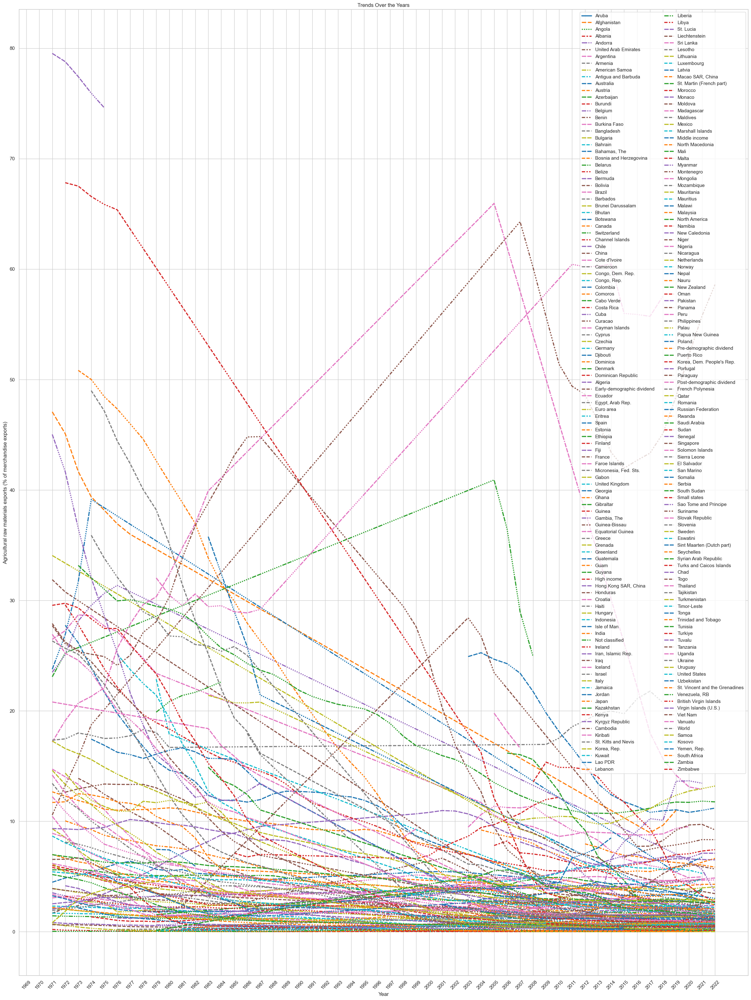

In [112]:

# Smooth the data using rolling mean
df_smoothed = df_paisesT.rolling(window=10).mean()

# Plot the data using Seaborn line plot
sns.set_theme(style="whitegrid")
plt.figure(figsize=(30, 40))
sns.lineplot(data=df_smoothed, palette="tab10", linewidth=2.5)
# Ajusta la leyenda aparte
plt.legend(loc='best', ncol=2)
# Optional: Adjust the figure size, title, labels, etc.
plt.title('Trends Over the Years')
plt.xlabel('Year')
plt.ylabel('Agricultural raw materials exports (% of merchandise exports)')
plt.xticks(rotation=45)


plt.show()

In [113]:
# with pd.ExcelWriter ('Limpiando_los_datos.xlsx', engine= 'xlsxwriter') as writer:
    
#     df_regionesT.to_excel(writer, sheet_name = 'Regiones-exportaciones_en_crudo', index=True)
#     df_paisesT.to_excel(writer, sheet_name = 'Paises-exportaciones_en_crudo', index=True)
#     df_paragraficar.to_excel(writer, sheet_name = 'exportaciones_en_crudo', index=False)

In [114]:
# Suponiendo que df es tu DataFrame
# Calcula el índice de la fila con el valor máximo en cada columna
max_indexP = df_paises.idxmax()

# Luego, puedes usar iloc para obtener las filas correspondientes
rows_with_max_valuesP = df_paises.loc[max_indexP]

# Esto te dará las filas que tienen los valores más altos en cada columna
print(rows_with_max_valuesP)

                      1962       1963       1964       1965       1966  \
Country Name                                                             
Chad             75.256697  79.962100  81.852079  80.093890  80.260715   
Chad             75.256697  79.962100  81.852079  80.093890  80.260715   
Chad             75.256697  79.962100  81.852079  80.093890  80.260715   
Chad             75.256697  79.962100  81.852079  80.093890  80.260715   
Chad             75.256697  79.962100  81.852079  80.093890  80.260715   
...                    ...        ...        ...        ...        ...   
Solomon Islands        NaN        NaN        NaN        NaN        NaN   
Benin             2.312579   5.401283   4.073391   4.889006  10.847620   
Benin             2.312579   5.401283   4.073391   4.889006  10.847620   
Benin             2.312579   5.401283   4.073391   4.889006  10.847620   
Benin             2.312579   5.401283   4.073391   4.889006  10.847620   

                      1967       1968

In [115]:
# Suponiendo que df es tu DataFrame
# Calcula el índice de la fila con el valor máximo en cada columna
max_indexR = df_regiones.idxmax()

# Luego, puedes usar iloc para obtener las filas correspondientes
rows_with_max_valueR = df_regiones.loc[max_indexR]

# Esto te dará las filas que tienen los valores más altos en cada columna
print(rows_with_max_valueR)

                                                         1962       1963  \
Country Name                                                               
Central African Republic                            40.751887  31.031882   
Central African Republic                            40.751887  31.031882   
IDA blend                                           30.415048  30.824693   
IDA blend                                           30.415048  30.824693   
IDA blend                                           30.415048  30.824693   
...                                                       ...        ...   
Central African Republic                            40.751887  31.031882   
Central African Republic                            40.751887  31.031882   
Central African Republic                            40.751887  31.031882   
IDA total                                                 NaN        NaN   
Latin America & the Caribbean (IDA & IBRD count...  16.955807  14.282479   

           

In [129]:
dfexcluyentes = df_paises.drop('Chad'  ,axis=0)
dfexcluyentes = df_paises.drop('Benin'  ,axis=0)
dfexcluyentes = df_paises.drop('Solomon Islands'  ,axis=0)
dfexcluyentes


,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
Country Name,,,,,,,,,,,,,,,,,,,,,
Aruba,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.046919,0.055358,0.092621,0.085188,0.079480,0.076267,0.104098,0.069199,0.102736,NaN
Afghanistan,53.755852,61.100605,54.437183,45.760896,51.714982,46.355726,38.092087,38.050799,35.824004,45.656350,...,0.036992,0.047523,14.799067,16.359109,17.063634,16.694599,21.035060,NaN,NaN,NaN
Angola,13.664356,NaN,NaN,NaN,NaN,NaN,NaN,9.381066,8.225802,9.813143,...,0.001974,0.008441,0.033736,0.233868,0.262744,0.357368,0.055077,0.092253,0.002204,0.001427
Albania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.336270,1.272659,2.305902,2.404998,0.489922,0.325400,0.492667,0.565251,0.468064,0.229069
Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.471719,1.397357,1.586937,1.751604,1.649945,1.527382,1.462971,0.849165,1.220612,0.506997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Kosovo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"Yemen, Rep.",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.158565,0.643776,1.549085,NaN,NaN,NaN,0.017167,NaN,NaN,NaN
South Africa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.948755,2.049448,2.302119,2.465114,2.368871,2.322444,1.883488,2.006564,1.704013,1.934010


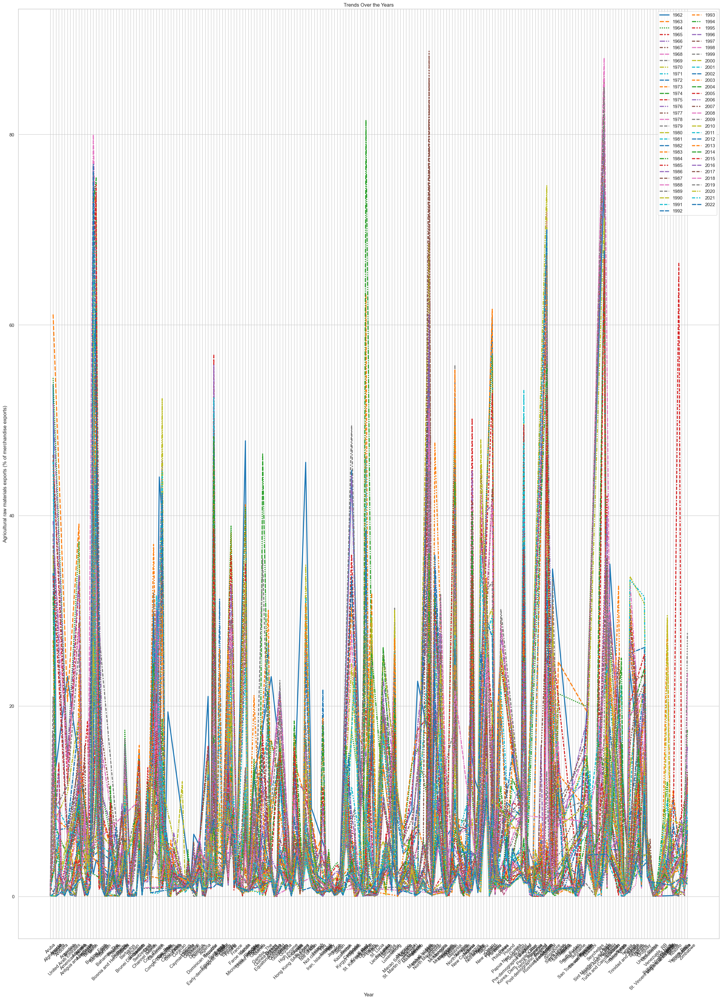

In [135]:
# Smooth the data using rolling mean
# df_smoothed = dfexcluyentes.rolling(window=12).mean()

# Plot the data using Seaborn line plot
sns.set_theme(style="whitegrid")
plt.figure(figsize=(30, 40))
sns.lineplot(data=dfexcluyentes, palette="tab10", linewidth=2.5)
# Ajusta la leyenda aparte
plt.legend(loc='best', ncol=2)
# Optional: Adjust the figure size, title, labels, etc.
plt.title('Trends Over the Years')
plt.xlabel('Year')
plt.ylabel('Agricultural raw materials exports (% of merchandise exports)')
plt.xticks(rotation=45)


plt.show()